<a href="https://colab.research.google.com/github/SasikaA073/AISP-Com-Photo-forks/blob/main/final_Modified_Autoencoder_sasikapamith21_dark_images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Get images from LOL dataset


In [1]:
!gdown --id 1E1rGvhzu0oWMuake4NBDbrKWZOVzDrFP

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1E1rGvhzu0oWMuake4NBDbrKWZOVzDrFP
From (redirected): https://drive.google.com/uc?id=1E1rGvhzu0oWMuake4NBDbrKWZOVzDrFP&confirm=t&uuid=5cba79d8-24b7-405f-ab93-71905f444272
To: /content/LOLdataset.zip
100% 347M/347M [00:06<00:00, 51.9MB/s]


In [2]:
import os
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
os.chdir("/content/")

In [4]:
# prompt: unzip LOLDataset.zip

!unzip LOLdataset

Archive:  LOLdataset.zip
   creating: eval15/
   creating: eval15/high/
  inflating: eval15/high/748.png     
   creating: __MACOSX/
   creating: __MACOSX/eval15/
   creating: __MACOSX/eval15/high/
  inflating: __MACOSX/eval15/high/._748.png  
  inflating: eval15/high/665.png     
  inflating: __MACOSX/eval15/high/._665.png  
  inflating: eval15/high/111.png     
  inflating: __MACOSX/eval15/high/._111.png  
  inflating: eval15/high/493.png     
  inflating: __MACOSX/eval15/high/._493.png  
  inflating: eval15/high/22.png      
  inflating: __MACOSX/eval15/high/._22.png  
  inflating: eval15/high/23.png      
  inflating: __MACOSX/eval15/high/._23.png  
  inflating: eval15/high/669.png     
  inflating: __MACOSX/eval15/high/._669.png  
  inflating: eval15/high/547.png     
  inflating: __MACOSX/eval15/high/._547.png  
  inflating: eval15/high/778.png     
  inflating: __MACOSX/eval15/high/._778.png  
  inflating: eval15/high/55.png      
  inflating: __MACOSX/eval15/high/._55.png  
  i

In [5]:
!mkdir with_noise without_noise

copy images to the with_noise, without_noise folders

In [6]:
!cp /content/our485/high/*.png /content/without_noise

In [7]:
!cp /content/our485/low/*.png /content/with_noise

In [8]:
os.chdir("/content/drive/MyDrive/experiment")

In [9]:
# function to calculate Loss

def mse_loss(image1, image2):
    # Convert images to NumPy arrays
    np_image1 = np.array(image1)
    np_image2 = np.array(image2)

    # Ensure both images have the same shape
    if np_image1.shape != np_image2.shape:
        raise ValueError("Input images must have the same shape.")

    # Calculate MSE for each RGB channel
    mse_r = np.mean((np_image1[:, :, 0] - np_image2[:, :, 0]) ** 2)
    mse_g = np.mean((np_image1[:, :, 1] - np_image2[:, :, 1]) ** 2)
    mse_b = np.mean((np_image1[:, :, 2] - np_image2[:, :, 2]) ** 2)

    # Calculate the overall MSE
    mse = (mse_r + mse_g + mse_b) / 3.0

    return mse

## 2. Autoencoder Architecture


In [10]:
import torch, os
import numpy as np
from torchvision import datasets
from torch import nn
import torchvision.models
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
from PIL import Image
from torch.utils.data import Dataset

from helpers import get_data_loaders, seed_all, anomaly_detection_display
import pandas as pd
import matplotlib.pyplot as plt

# Ensure repeatability
seed_all(42)

In [11]:
class upperLeftCornerCrop(object):
    def __call__(self, img):
        # Ensure the input is a PIL Image
        if not isinstance(img, Image.Image):
            raise TypeError("Input image should be a PIL Image. Got {}".format(type(img)))

        # Crop the image to 200x200 pixels from the upper-left corner
        cropped_img = img.crop((0, 0, 200, 200))
        return cropped_img

In [12]:
img_transform = v2.Compose([
    upperLeftCornerCrop(), # Crop the image to 200x200 pixels from the upper-left corner
    v2.ToTensor(), # normalise the image matrix (Convert PIL image 0-255 -> 0-1)
])


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [13]:
class LOLDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.images = os.listdir(root_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.images[idx])
        image = Image.open(img_name).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image


In [14]:
validation_clean_dataset = LOLDataset("/content/eval15/high/",transform=img_transform)
validation_noisy_dataset = LOLDataset("/content/eval15/low/",transform=img_transform)

In [15]:
noisy_dataset = LOLDataset("/content/with_noise", transform=img_transform)
clean_dataset = LOLDataset("/content/without_noise", transform=img_transform)

In [16]:
from torch.utils.data import DataLoader

batch_size = 64 # for testing changed this to 1 from 64
shuffle = False

noisy_data_loader = DataLoader(noisy_dataset, batch_size=batch_size, shuffle=shuffle)
clean_data_loader = DataLoader(clean_dataset, batch_size = batch_size, shuffle=shuffle)

In [17]:
# Test data loaders
noisy_test_data_loader = DataLoader(validation_noisy_dataset, batch_size=batch_size, shuffle=shuffle)
clean_test_data_loader = DataLoader(validation_clean_dataset, batch_size = batch_size, shuffle=shuffle)

In [18]:
print(f"{len(noisy_data_loader)}")
print(len(clean_test_data_loader))

8
1


In [19]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Assuming 'transform' is your transformation pipeline (including ToTensor)
# Example tensor (replace this with your actual tensor)
# tensor_image = torch.rand(3, 224, 224)  # Example random tensor with shape (channels, height, width)

# Convert tensor to a PIL image
tensor_to_pil = transforms.ToPILImage()

# Function to show tensor image
def showImage(tensoredImage):

  # Display the image using Matplotlib
  plt.imshow(tensor_to_pil(tensoredImage))
  plt.axis('off')  # Hide axis ticks and labels
  plt.show()


In [20]:
# Check if CUDA is available
if torch.cuda.is_available():
    print("CUDA is available!")
    # Get the number of available GPUs
    num_devices = torch.cuda.device_count()
    print(f"Number of available GPUs: {num_devices}")
    # Get the current GPU device
    current_device = torch.cuda.current_device()
    print(f"Current GPU device: {current_device}")
    # Get the name of the GPU
    gpu_name = torch.cuda.get_device_name(current_device)
    print(f"GPU name: {gpu_name}")
else:
    print("CUDA is not available. Using CPU.")


CUDA is available!
Number of available GPUs: 1
Current GPU device: 0
GPU name: Tesla T4


In [21]:
# Number of epochs to train the model
n_epochs = 30

In [22]:
# Check if CUDA (GPU support) is available, and if available, use GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [23]:
len_data_loader = len(noisy_data_loader)


In [24]:
clean_loader , noisy_loader = clean_data_loader, noisy_data_loader

In [25]:
# !mkdir checkpoints

In [26]:
save_path = "modified_autoencoder.pt"

### Check dimensions

In [27]:
# v.shape

___


In [28]:
# # Specify loss function
# criterion = nn.MSELoss()

# # Specify optimizer
# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [29]:
noisy_test_iter = iter(noisy_test_data_loader)
clean_test_iter = iter(clean_test_data_loader)

In [30]:
from PIL import Image




def showImages3(image1, image2,image3, image1_title, image2_title, image3_title, save_path):
    axis_show = "off"
    fig, axes = plt.subplots(1, 3, figsize=(10,5))  # Create a figure with two subplots
    axes[0].imshow(tensor_to_pil(image1))  # Show the first image on the left subplot
    axes[0].axis(axis_show)  # Hide axis for the left subplot
    axes[0].set_title(image1_title)  # Set title for the left subplot

    axes[1].imshow(tensor_to_pil(image2))  # Show the second image on the right subplot
    axes[1].axis(axis_show)  # Hide axis for the right subplot
    axes[1].set_title(image2_title)  # Set title for the right subplot

    axes[2].imshow(tensor_to_pil(image3))  # Show the second image on the right subplot
    axes[2].axis(axis_show)  # Hide axis for the right subplot
    axes[2].set_title(image3_title)  # Set title for the right subplot

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(save_path)  # Save the entire figure to a file
    plt.show()
    # plt.close()


In [31]:
import torch.nn.functional as F
from torchvision.transforms import ToTensor

def mse_loss(image1, image2):
    # Convert images to PyTorch tensors
    tensor_image1 = image1
    tensor_image2 = image2

    # Ensure both tensors have the same shape
    if tensor_image1.shape != tensor_image2.shape:
        raise ValueError("Input images must have the same shape.")

    # Calculate MSE for each RGB channel
    mse_r = F.mse_loss(tensor_image1[0], tensor_image2[0])
    mse_g = F.mse_loss(tensor_image1[1], tensor_image2[1])
    mse_b = F.mse_loss(tensor_image1[2], tensor_image2[2])

    # Calculate the overall MSE
    mse = (mse_r + mse_g + mse_b) / 3.0

    return mse.item()



from PIL import Image

def showImages_side_by_side(image1, image2, image1_title, image2_title):
  # image
  # Calculate MSE loss
    loss = mse_loss(image1, image2)
    print(f"Image 1: {image1_title}")
    print(f"Image 2: {image2_title}")
    print(f"MSE Loss: {loss}")

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Create a figure with two subplots
    axes[0].imshow(tensor_to_pil(image1))  # Show the first image on the left subplot
    axes[0].axis('off')  # Hide axis for the left subplot
    axes[0].set_title(image1_title)  # Set title for the left subplot

    axes[1].imshow(tensor_to_pil(image2))  # Show the second image on the right subplot
    axes[1].axis('off')  # Hide axis for the right subplot
    axes[1].set_title(image2_title)  # Set title for the right subplot

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()








torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])
Image 1: noisy0
Image 2: clean0
MSE Loss: 0.10800844430923462


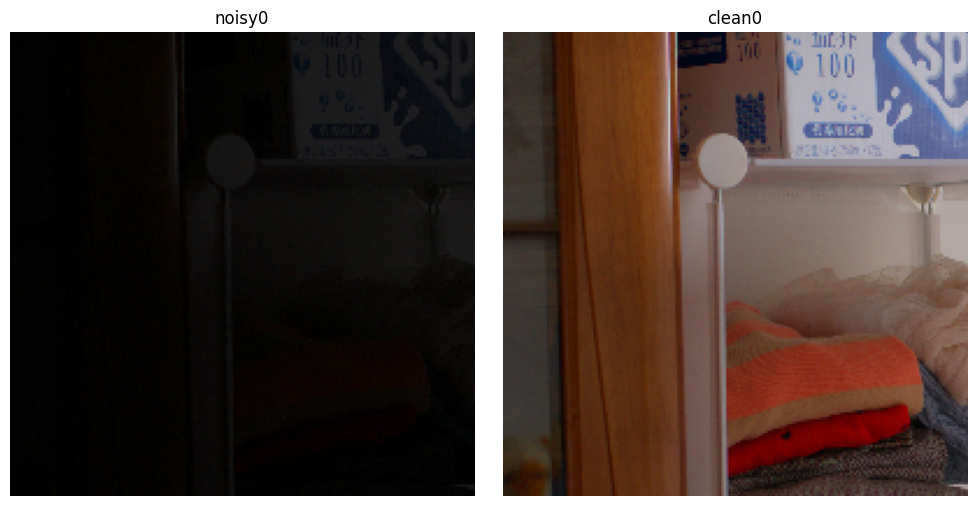

Image 1: noisy1
Image 2: clean1
MSE Loss: 0.13020791113376617


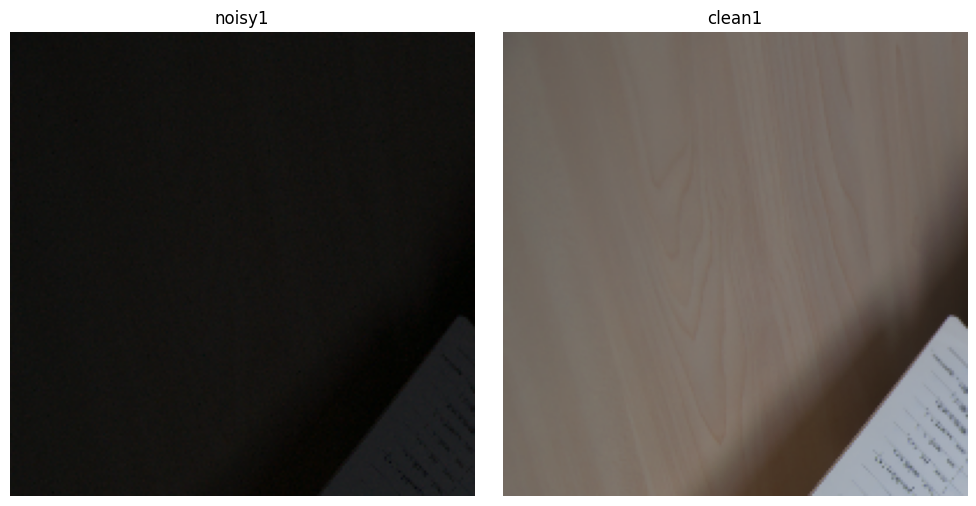

In [32]:
from itertools import zip_longest

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
  print(noisy_test_batch.shape, clean_test_batch.shape)

  for i in range(noisy_test_batch.shape[0]):
    noisy_test_img = noisy_test_batch[i]
    clean_test_img = clean_test_batch[i]
    showImages_side_by_side(noisy_test_img, clean_test_img, f"noisy{i}", f"clean{i}")

    if i == 1:
      break


In [33]:
for i,v in enumerate(clean_data_loader):
  print(i)
  print(v.shape)

test = v

0
torch.Size([64, 3, 200, 200])
1
torch.Size([64, 3, 200, 200])
2
torch.Size([64, 3, 200, 200])
3
torch.Size([64, 3, 200, 200])
4
torch.Size([64, 3, 200, 200])
5
torch.Size([64, 3, 200, 200])
6
torch.Size([64, 3, 200, 200])
7
torch.Size([37, 3, 200, 200])


In [34]:
!pip install livelossplot
from livelossplot import PlotLosses

In [35]:
def get_conv_output_size(input_width, kernel_width, padding, stride, in_channels, out_channels):
    """
    Calculate the output size of a convolutional layer.

    Parameters:
    - input_width (int): Size of the input feature map.
    - kernel_width (int): Size of the convolutional kernel.
    - padding (int): Padding added to the input feature map.
    - stride (int): Stride of the convolution.

    Returns:
    - output_size (int): Size of the output feature map.
    """
    output_width = ((input_width - kernel_width + 2 * padding) // stride) + 1
    print("input_size", (input_width, input_width, in_channels))
    print("output_size", (output_width, output_width, out_channels))

In [36]:
input_size = get_conv_output_size(200, 3, 1, 1,in_channels=3, out_channels=32)

input_size (200, 200, 3)
output_size (200, 200, 32)


In [37]:
throw ERROR

SyntaxError: invalid syntax (<ipython-input-37-5ec054872f64>, line 1)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import copy

# define the NN architecture
class ModConvDenoiser(nn.Module):
    def __init__(self):
        super(ModConvDenoiser, self).__init__()
        ## encoder layers ##
        self.encoder = nn.Sequential(
            # in_channels : number of channels per image ; for RGB -> 3
            # out_channels : number of convolutional filters with #in_channel of kernels per filters

            # -------------------------------------------------------
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=32), # number of channels are the features
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=64),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=64, out_channels=128,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=128),
            nn.MaxPool2d(kernel_size=2, stride=2)

        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(128),

            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(64),

            nn.ConvTranspose2d(in_channels=64, out_channels=32,kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1, stride=1),
            nn.Sigmoid()
        )

        self.model = nn.Sequential(
            self.encoder,
            self.decoder
        )


    def forward(self, x):
        return self.model(x)

    def get_encoder_architecture(self):
      print("*** Encoder Architecture")
      print(self.encoder)

    def get_decoder_architecture(self):
      print("*** Decoder Architecture")
      print(self.decoder)

    def debug_encoder(self,x,printDebugOutput=True):
      """Pass thorugh a dataloader with one image per batch"""
      encoder_test_tensor = copy.deepcopy(x)

      if printDebugOutput:
        print("\nPassing thorugh Encoder >>> \n")
        print("Original Image size : ")
        print(encoder_test_tensor.shape)

      for i, layer in enumerate(self.encoder):

        encoder_test_tensor = layer(encoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(encoder_test_tensor.shape)


      return encoder_test_tensor

    def debug_decoder(self,x,printDebugOutput=True):
      """Pass through a dataloader with one image per batch"""
      # decoder_test_tensor = copy.deepcopy(x)
      decoder_test_tensor = x

      if printDebugOutput:
        print("\nPassing thorugh Decoder >>> \n")
        print("Original Input size : ")
        print(decoder_test_tensor.shape)

      for i, layer in enumerate(self.decoder):

        decoder_test_tensor = layer(decoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(decoder_test_tensor.shape)

      return decoder_test_tensor

# initialize the NN
model = ModConvDenoiser()

# model.get_encoder_architecture()

encoder_output = model.debug_encoder(test,printDebugOutput=False)
decoder_output = model.debug_decoder(encoder_output,printDebugOutput=True)

In [38]:
# prompt: use cuda

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device);

NameError: name 'model' is not defined

In [39]:
isTraining = True

In [ ]:
# encoder_output = model.debug_encoder(test,printDebugOutput=True)

In [ ]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_3.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoenocder_model = ModConvDenoiser()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoenocder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoenocder_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images in clean_data_loader:
            clean_images = clean_images.to(device)
            optimizer.zero_grad()

            noisy_reconstructed = modified_autoenocder_model(clean_images)

            loss = criterion(noisy_reconstructed, clean_images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoenocder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [ ]:
len(clean_data_loader)

In [ ]:
len(clean_test_data_loader)

In [ ]:
for clean_test_batch in clean_test_data_loader:
  print(clean_test_batch.shape)

  clean_reconstructed = modified_autoenocder_model(clean_test_batch.to(device))

  for i in range(clean_test_batch.shape[0]):
    noisy_test_img = noisy_test_batch[i]
    reconstructed_images = clean_reconstructed[i]
    clean_test_img = clean_test_batch[i]

    showImages_side_by_side( reconstructed_images, clean_test_img,f"clean_reconstructed_{i}", f"clean_{i}")


In [ ]:
!ls

# Modified 2

In [41]:
import torch.nn as nn
import torch.nn.functional as F
import copy

# define the NN architecture
class ModConvDenoiser19(nn.Module):
    def __init__(self):
        super(ModConvDenoiser19, self).__init__()
        ## encoder layers ##
        self.encoder = nn.Sequential(
            # in_channels : number of channels per image ; for RGB -> 3
            # out_channels : number of convolutional filters with #in_channel of kernels per filters

            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=32), # number of channels are the features
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=64),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=64, out_channels=128,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=128),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=128, out_channels=256,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=256),
            nn.MaxPool2d(kernel_size=3, stride=1, padding=1),

            nn.Conv2d(in_channels=256, out_channels=512,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=512),
            nn.MaxPool2d(kernel_size=3, stride=1, padding=1)

        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(512),

            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(256),

            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(128),

            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(64),

            nn.ConvTranspose2d(in_channels=64, out_channels=32,kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1, stride=1),
            nn.Sigmoid()
        )

        self.model = nn.Sequential(
            self.encoder,
            self.decoder
        )


    def forward(self, x):
        return self.model(x)

    def get_encoder_architecture(self):
      print("*** Encoder Architecture")
      print(self.encoder)

    def get_decoder_architecture(self):
      print("*** Decoder Architecture")
      print(self.decoder)

    def debug_encoder(self,x,printDebugOutput=True):
      """Pass thorugh a dataloader with one image per batch"""
      encoder_test_tensor = copy.deepcopy(x)

      if printDebugOutput:
        print("\nPassing thorugh Encoder >>> \n")
        print("Original Image size : ")
        print(encoder_test_tensor.shape)

      for i, layer in enumerate(self.encoder):

        encoder_test_tensor = layer(encoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(encoder_test_tensor.shape)


      return encoder_test_tensor

    def debug_decoder(self,x,printDebugOutput=True):
      """Pass through a dataloader with one image per batch"""
      # decoder_test_tensor = copy.deepcopy(x)
      decoder_test_tensor = x

      if printDebugOutput:
        print("\nPassing thorugh Decoder >>> \n")
        print("Original Input size : ")
        print(decoder_test_tensor.shape)

      for i, layer in enumerate(self.decoder):

        decoder_test_tensor = layer(decoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(decoder_test_tensor.shape)

      return decoder_test_tensor

# initialize the NN
model = ModConvDenoiser19()

# model.get_encoder_architecture()

encoder_output = model.debug_encoder(test,printDebugOutput=True)
decoder_output = model.debug_decoder(encoder_output,printDebugOutput=True)


Passing thorugh Encoder >>> 

Original Image size : 
torch.Size([37, 3, 200, 200])
layer  0 :  Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
torch.Size([37, 32, 200, 200])
layer  1 :  ReLU()
torch.Size([37, 32, 200, 200])
layer  2 :  BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([37, 32, 200, 200])
layer  3 :  MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
torch.Size([37, 32, 100, 100])
layer  4 :  Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
torch.Size([37, 64, 100, 100])
layer  5 :  ReLU()
torch.Size([37, 64, 100, 100])
layer  6 :  BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
torch.Size([37, 64, 100, 100])
layer  7 :  MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
torch.Size([37, 64, 50, 50])
layer  8 :  Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
torch.Size([37, 128, 50, 50])
layer  9 :

In [ ]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_4.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoenocder_model = ModConvDenoiser19()
modified_autoen

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoenocder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoenocder_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images in clean_data_loader:
            clean_images = clean_images.to(device)
            optimizer.zero_grad()

            noisy_reconstructed = modified_autoenocder_model(clean_images)

            loss = criterion(noisy_reconstructed, clean_images) +
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoenocder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [ ]:
for clean_test_batch in clean_test_data_loader:
  print(clean_test_batch.shape)

  clean_reconstructed = modified_autoenocder_model(clean_test_batch.to(device))

  for i in range(clean_test_batch.shape[0]):
    noisy_test_img = noisy_test_batch[i]
    reconstructed_images = clean_reconstructed[i]
    clean_test_img = clean_test_batch[i]

    showImages_side_by_side( reconstructed_images, clean_test_img,f"clean_reconstructed_{i}", f"clean_{i}")


# Attempt 4: on dark images


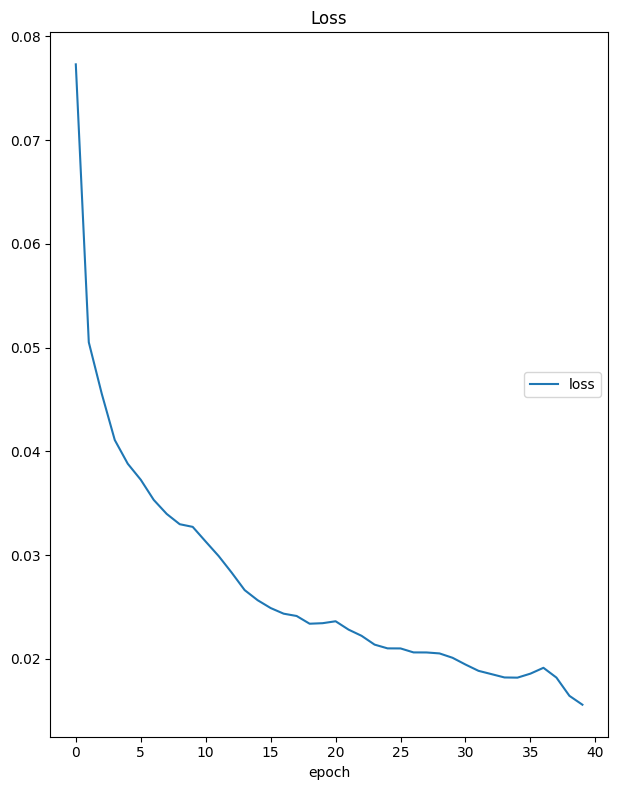

Loss
	loss             	 (min:    0.016, max:    0.077, cur:    0.016)


In [43]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_4_on_dark_images.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoencoder_model = ModConvDenoiser19()
modified_autoencoder_model.train()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoencoder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoencoder_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images, noisy_images in zip(clean_data_loader, noisy_data_loader):
            # Move data to GPU if available
            clean_images = clean_images.to(device)
            noisy_images = noisy_images.to(device)

            # clear the gradients of all optimized variables
            optimizer.zero_grad()

            ## forward pass: compute predicted outputs by passing *noisy* images to the model
            clean_reconstructed = modified_autoencoder_model(clean_images)
            noisy_reconstructed = modified_autoencoder_model(noisy_images)

            # Compute the loss (MSE between clean and reconstructed images)
            loss = criterion(noisy_reconstructed, clean_images) + criterion(clean_reconstructed, clean_images)

            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoencoder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [ ]:
modified_autoenocder_model.eval()

for clean_test_batch in clean_test_data_loader:
  print(clean_test_batch.shape)

  clean_reconstructed = modified_autoenocder_model(clean_test_batch.to(device))

  for i in range(clean_test_batch.shape[0]):
    noisy_test_img = noisy_test_batch[i]
    reconstructed_images = clean_reconstructed[i]
    clean_test_img = clean_test_batch[i]

    showImages_side_by_side( reconstructed_images, clean_test_img,f"clean_reconstructed_{i}", f"clean_{i}")


## Attempt 4 : results after 40 Epochs

torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])

noisy_test_batch is on cuda:0
clean_test_batch is on cuda:0
cuda:0
Model is on CUDA (GPU)
noisy_reconstructed_batch is on cuda:0


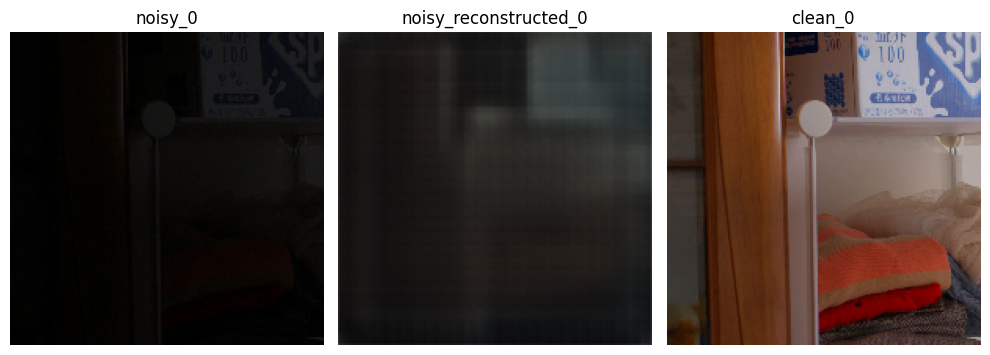

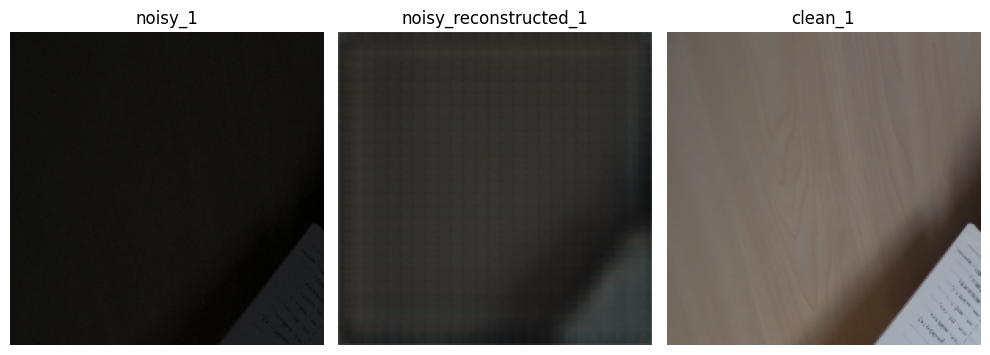

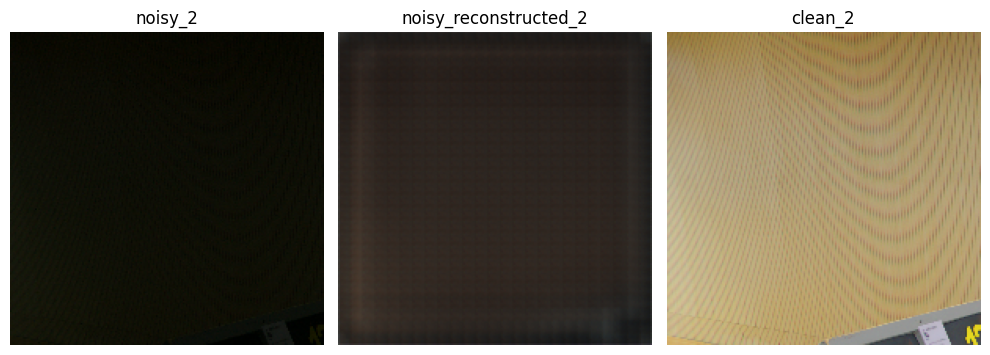

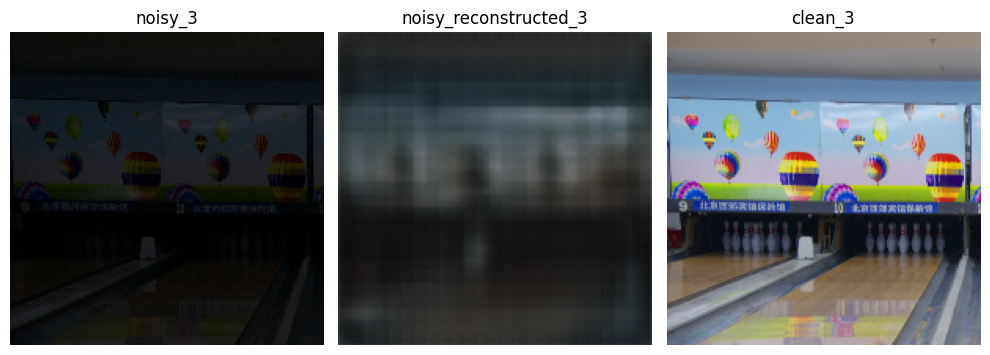

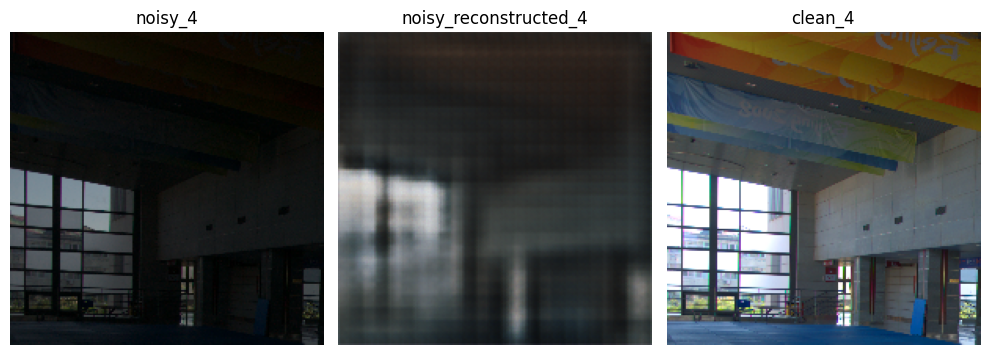

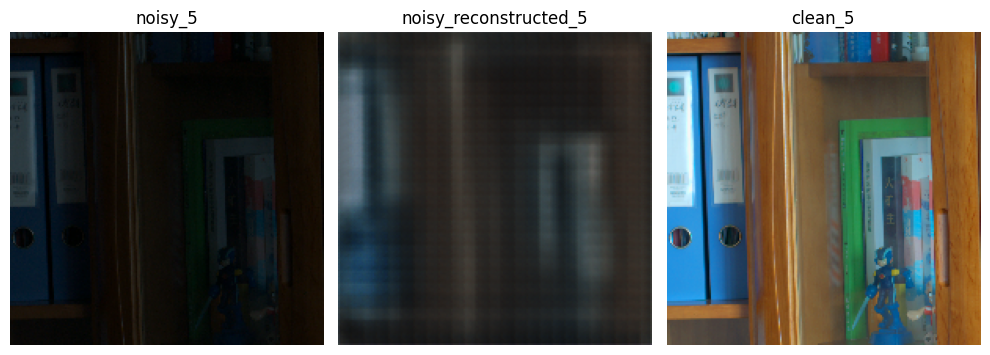

In [46]:
from itertools import zip_longest

modified_autoencoder_model.eval()

noisy_test_batch = noisy_test_batch.to(device)
modified_autoencoder_model = modified_autoencoder_model.to(device)

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
    print(noisy_test_batch.shape, clean_test_batch.shape)
    print()
    noisy_test_batch = noisy_test_batch.to("cuda")
    clean_test_batch = clean_test_batch.to("cuda")
    print(f"noisy_test_batch is on {noisy_test_batch.device}")
    print(f"clean_test_batch is on {clean_test_batch.device}")

    print(device)
    if next(modified_autoencoder_model.parameters()).is_cuda:
        print("Model is on CUDA (GPU)")
    else:
        print("Model is on CPU")
    noisy_reconstructed = modified_autoencoder_model(noisy_test_batch)

    print(f"noisy_reconstructed_batch is on {noisy_reconstructed.device}")


    for i in range(noisy_test_batch.shape[0]):
        noisy_test_img = noisy_test_batch[i]
        noisy_recons_img = noisy_reconstructed[i]
        clean_test_img = clean_test_batch[i]
        showImages3(noisy_test_img, noisy_recons_img, clean_test_img, f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}",save_path=f"/content/drive/MyDrive/Colab Notebooks/attempt_4_cri_noise_clean_{i}.png" )
        # pass

        if i == 5:
            break


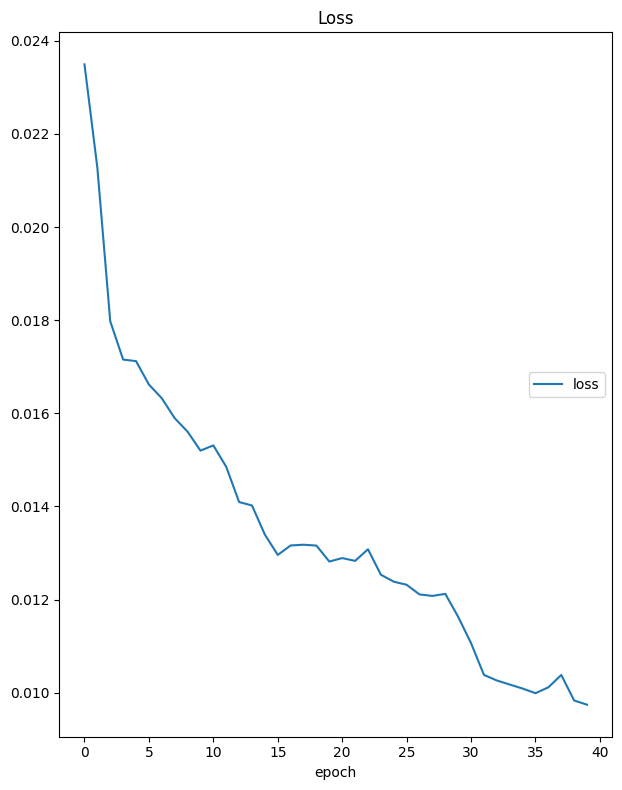

Loss
	loss             	 (min:    0.010, max:    0.023, cur:    0.010)


In [47]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# # Tried training again ####################################

# save_path = "checkpoints/modified_archi_model_attempt_4_on_dark_images.pt"

# # prompt: ## 4.1 Load Model from the saved checkpoints
# modified_autoencoder_model = ModConvDenoiser19()
modified_autoencoder_model.train()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoencoder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoencoder_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images, noisy_images in zip(clean_data_loader, noisy_data_loader):
            # Move data to GPU if available
            clean_images = clean_images.to(device)
            noisy_images = noisy_images.to(device)

            # clear the gradients of all optimized variables
            optimizer.zero_grad()

            ## forward pass: compute predicted outputs by passing *noisy* images to the model
            clean_reconstructed = modified_autoencoder_model(clean_images)
            noisy_reconstructed = modified_autoencoder_model(noisy_images)

            # Compute the loss (MSE between clean and reconstructed images)
            loss = criterion(noisy_reconstructed, clean_images) + criterion(clean_reconstructed, clean_images)

            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoencoder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

## Attempt 4 : results after 80 Epochs

torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])

noisy_test_batch is on cuda:0
clean_test_batch is on cuda:0
cuda:0
Model is on CUDA (GPU)
noisy_reconstructed_batch is on cuda:0


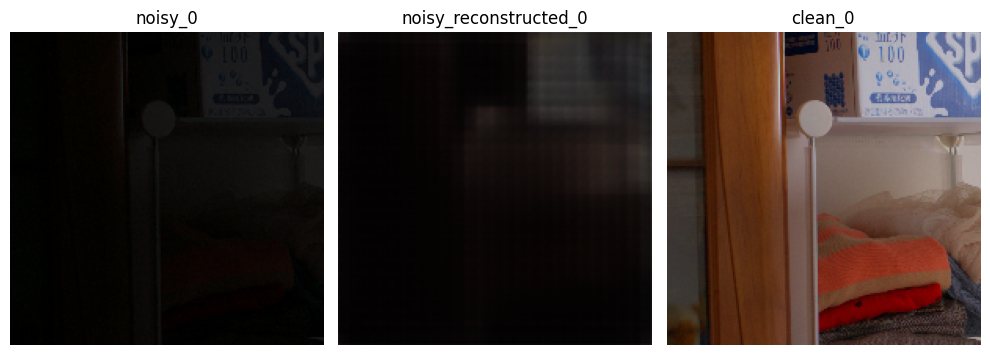

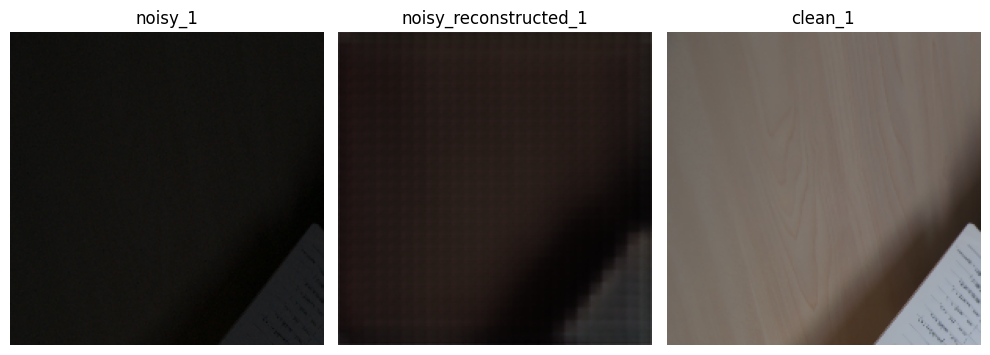

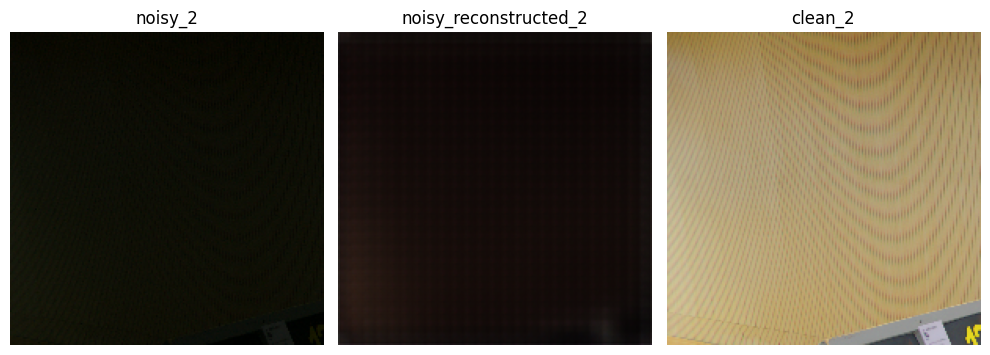

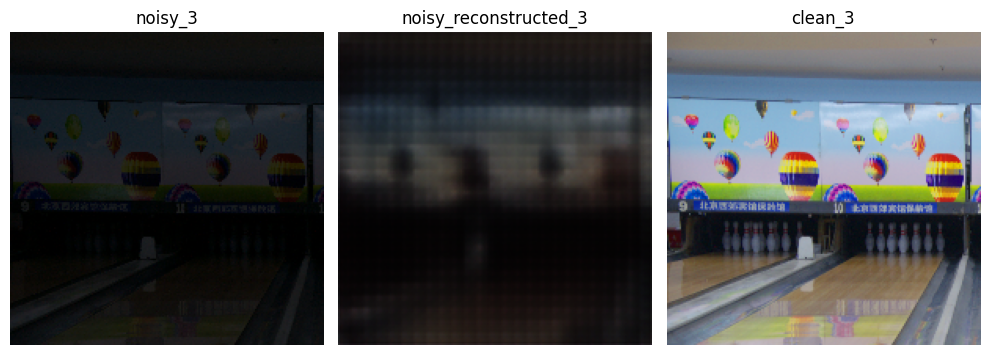

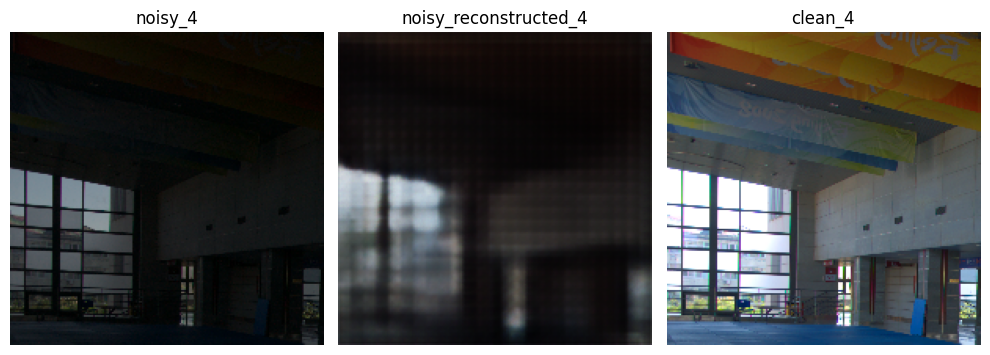

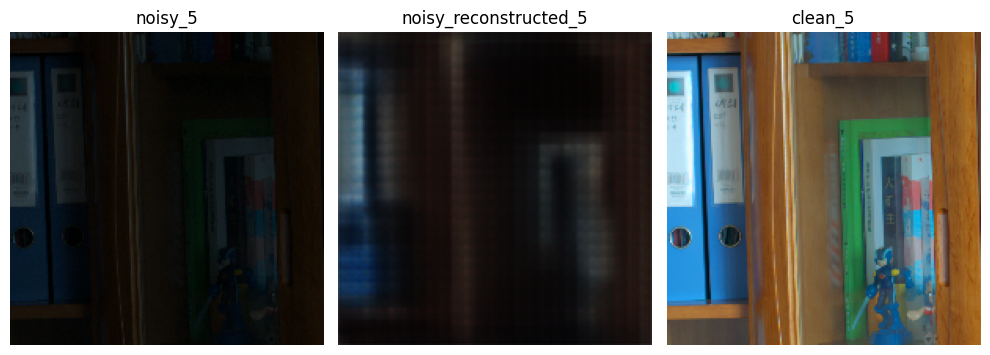

In [48]:
from itertools import zip_longest

modified_autoencoder_model.eval()

noisy_test_batch = noisy_test_batch.to(device)
modified_autoencoder_model = modified_autoencoder_model.to(device)

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
    print(noisy_test_batch.shape, clean_test_batch.shape)
    print()
    noisy_test_batch = noisy_test_batch.to("cuda")
    clean_test_batch = clean_test_batch.to("cuda")
    print(f"noisy_test_batch is on {noisy_test_batch.device}")
    print(f"clean_test_batch is on {clean_test_batch.device}")

    print(device)
    if next(modified_autoencoder_model.parameters()).is_cuda:
        print("Model is on CUDA (GPU)")
    else:
        print("Model is on CPU")
    noisy_reconstructed = modified_autoencoder_model(noisy_test_batch)

    print(f"noisy_reconstructed_batch is on {noisy_reconstructed.device}")


    for i in range(noisy_test_batch.shape[0]):
        noisy_test_img = noisy_test_batch[i]
        noisy_recons_img = noisy_reconstructed[i]
        clean_test_img = clean_test_batch[i]
        showImages3(noisy_test_img, noisy_recons_img, clean_test_img, f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}",save_path=f"/content/drive/MyDrive/Colab Notebooks/attempt_4_cri_noise_clean_{i}.png" )
        # pass

        if i == 5:
            break


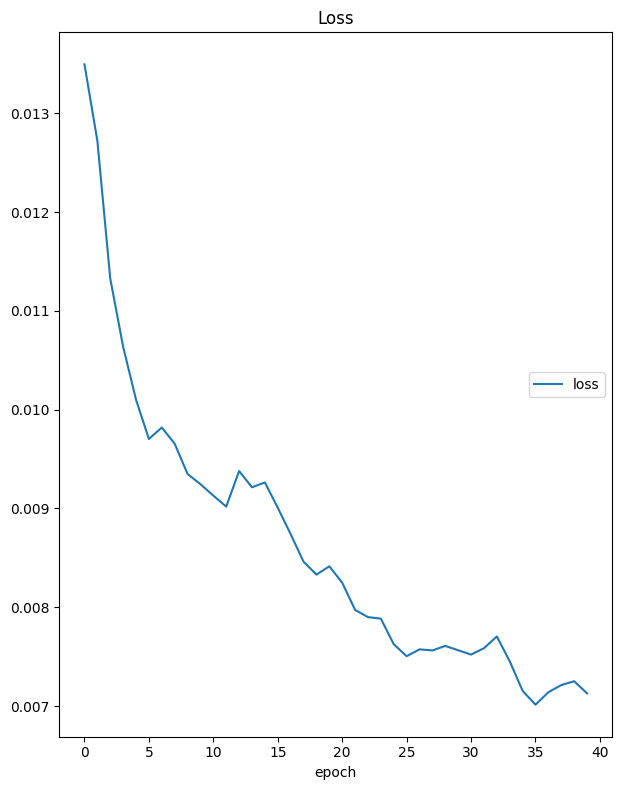

Loss
	loss             	 (min:    0.007, max:    0.013, cur:    0.007)


In [49]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# # Tried training again ####################################

# save_path = "checkpoints/modified_archi_model_attempt_4_on_dark_images.pt"

# # prompt: ## 4.1 Load Model from the saved checkpoints
# modified_autoencoder_model = ModConvDenoiser19()
modified_autoencoder_model.train()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoencoder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoencoder_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images, noisy_images in zip(clean_data_loader, noisy_data_loader):
            # Move data to GPU if available
            clean_images = clean_images.to(device)
            noisy_images = noisy_images.to(device)

            # clear the gradients of all optimized variables
            optimizer.zero_grad()

            ## forward pass: compute predicted outputs by passing *noisy* images to the model
            clean_reconstructed = modified_autoencoder_model(clean_images)
            noisy_reconstructed = modified_autoencoder_model(noisy_images)

            # Compute the loss (MSE between clean and reconstructed images)
            # Why I chose this one : 1st: remove_noise, 2nd: teaches compression
            loss = criterion(noisy_reconstructed, clean_images) + criterion(clean_reconstructed, clean_images)

            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoencoder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

## Attempt 4 : results after 120 Epochs

torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])

noisy_test_batch is on cuda:0
clean_test_batch is on cuda:0
cuda:0
Model is on CUDA (GPU)
noisy_reconstructed_batch is on cuda:0


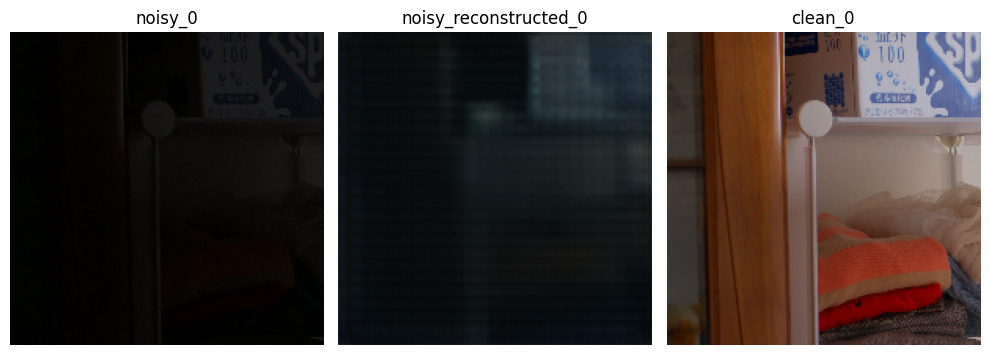

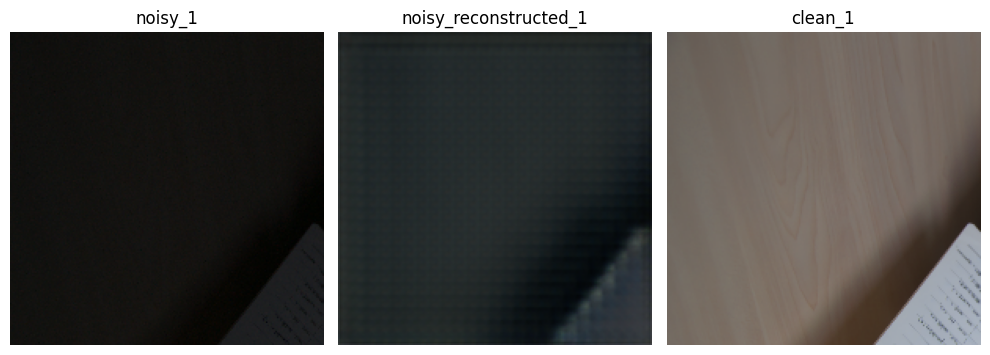

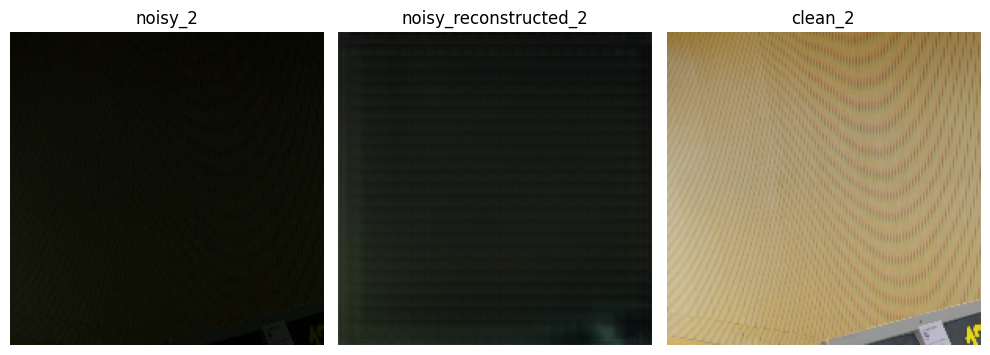

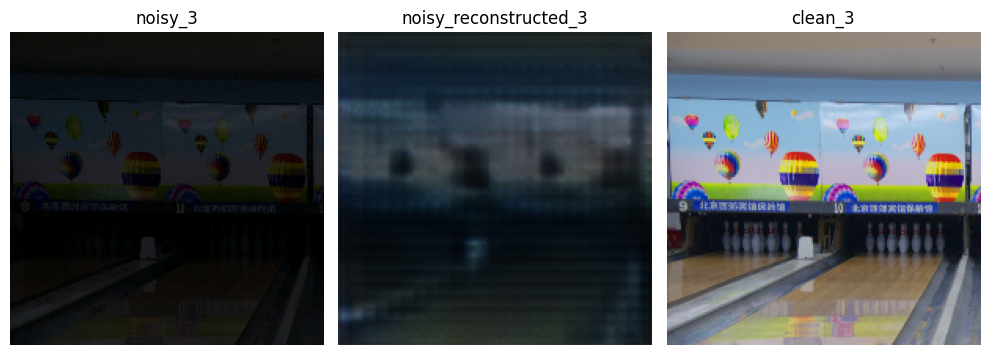

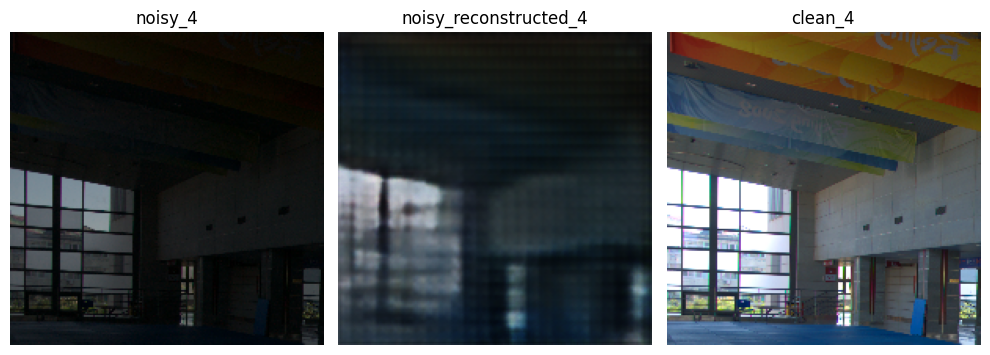

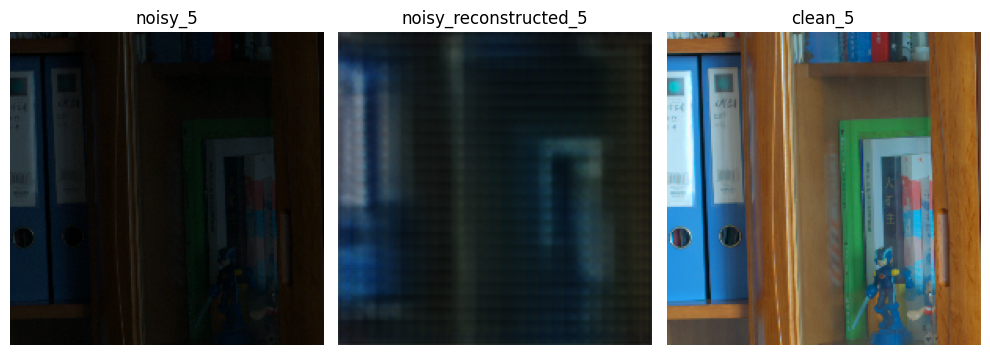

In [50]:
from itertools import zip_longest

modified_autoencoder_model.eval()

noisy_test_batch = noisy_test_batch.to(device)
modified_autoencoder_model = modified_autoencoder_model.to(device)

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
    print(noisy_test_batch.shape, clean_test_batch.shape)
    print()
    noisy_test_batch = noisy_test_batch.to("cuda")
    clean_test_batch = clean_test_batch.to("cuda")
    print(f"noisy_test_batch is on {noisy_test_batch.device}")
    print(f"clean_test_batch is on {clean_test_batch.device}")

    print(device)
    if next(modified_autoencoder_model.parameters()).is_cuda:
        print("Model is on CUDA (GPU)")
    else:
        print("Model is on CPU")
    noisy_reconstructed = modified_autoencoder_model(noisy_test_batch)

    print(f"noisy_reconstructed_batch is on {noisy_reconstructed.device}")


    for i in range(noisy_test_batch.shape[0]):
        noisy_test_img = noisy_test_batch[i]
        noisy_recons_img = noisy_reconstructed[i]
        clean_test_img = clean_test_batch[i]
        showImages3(noisy_test_img, noisy_recons_img, clean_test_img, f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}",save_path=f"/content/drive/MyDrive/Colab Notebooks/attempt_4_cri_noise_clean_after_120_epochs_{i}.png" )
        # pass

        if i == 5:
            break


# Attempt 4 : with only one criterion for loss (noisy_reconstructed, clean)


In [54]:
torch.cuda.empty_cache()


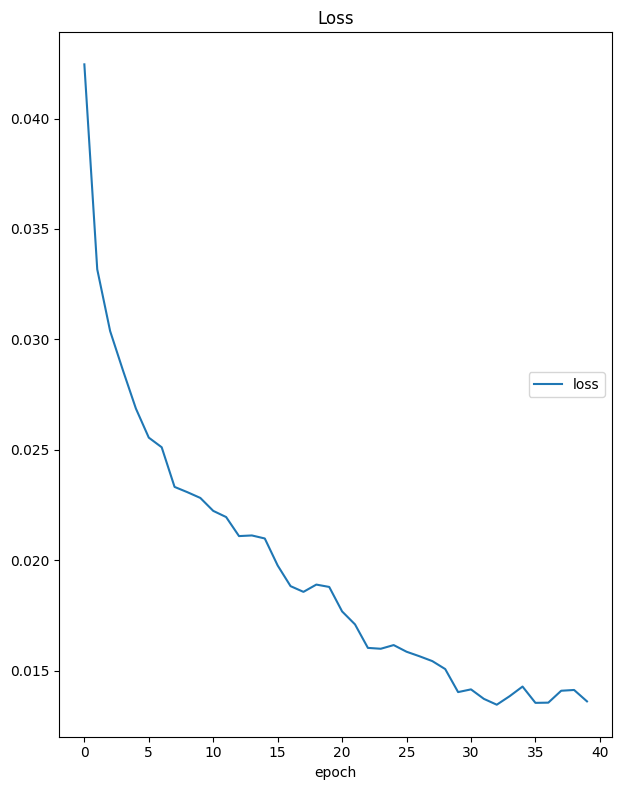

Loss
	loss             	 (min:    0.013, max:    0.042, cur:    0.014)


In [56]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_4_on_dark_images_loss_noisy_reconstructed_clean.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoencoder_model2 = ModConvDenoiser19()
modified_autoencoder_model2.train()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoencoder_model2.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoencoder_model2.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images, noisy_images in zip(clean_data_loader, noisy_data_loader):
            # Move data to GPU if available
            clean_images = clean_images.to(device)
            noisy_images = noisy_images.to(device)

            # clear the gradients of all optimized variables
            optimizer.zero_grad()

            ## forward pass: compute predicted outputs by passing *noisy* images to the model
            # clean_reconstructed = modified_autoencoder_model2(clean_images)
            noisy_reconstructed = modified_autoencoder_model2(noisy_images)

            # Compute the loss (MSE between clean and reconstructed images)
            loss = criterion(noisy_reconstructed, clean_images)

            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoencoder_model2.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])

noisy_test_batch is on cuda:0
clean_test_batch is on cuda:0
cuda:0
Model is on CUDA (GPU)
noisy_reconstructed_batch is on cuda:0


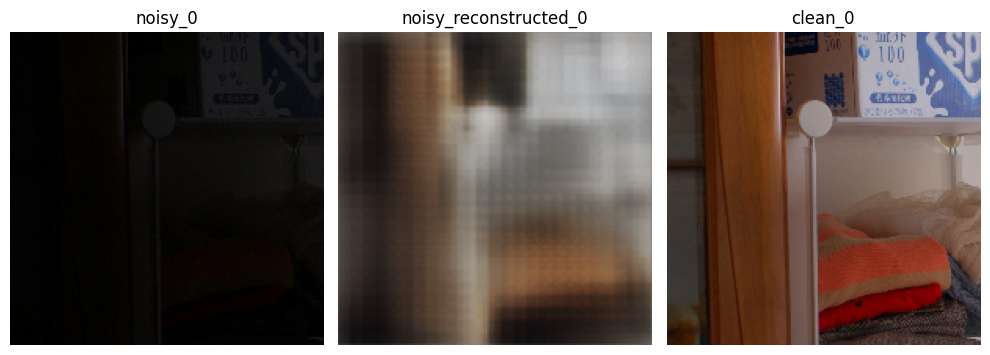

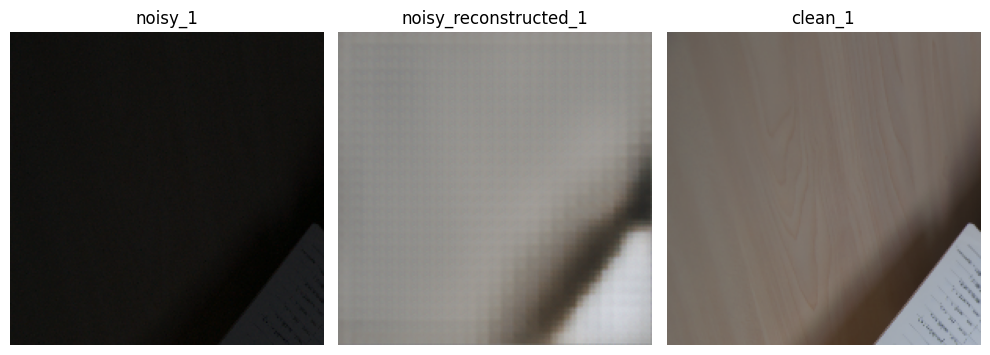

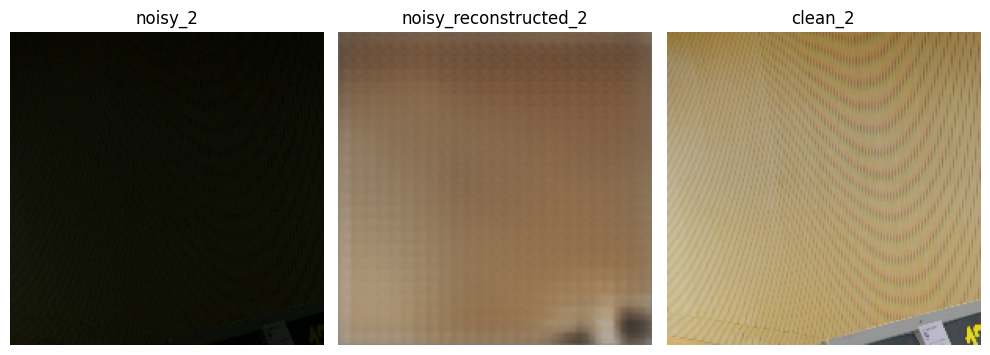

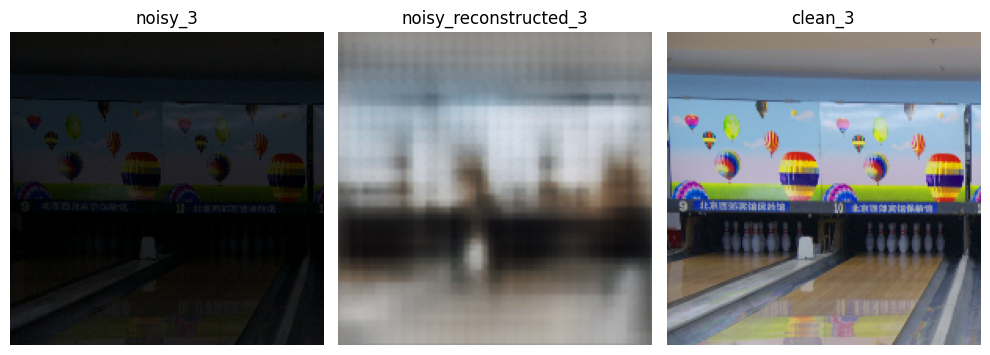

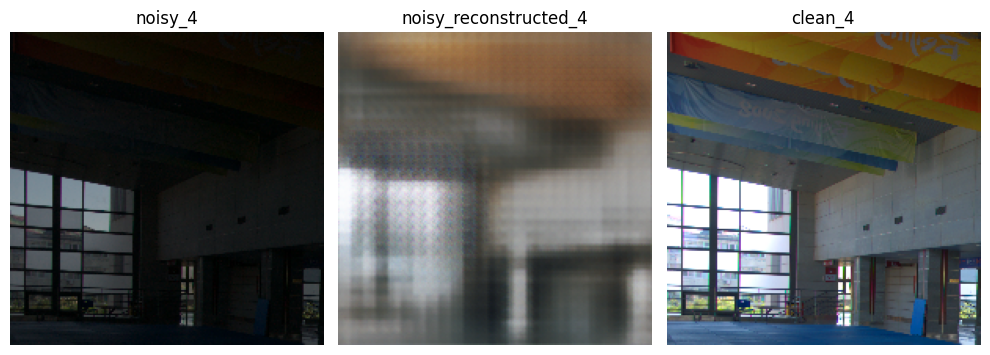

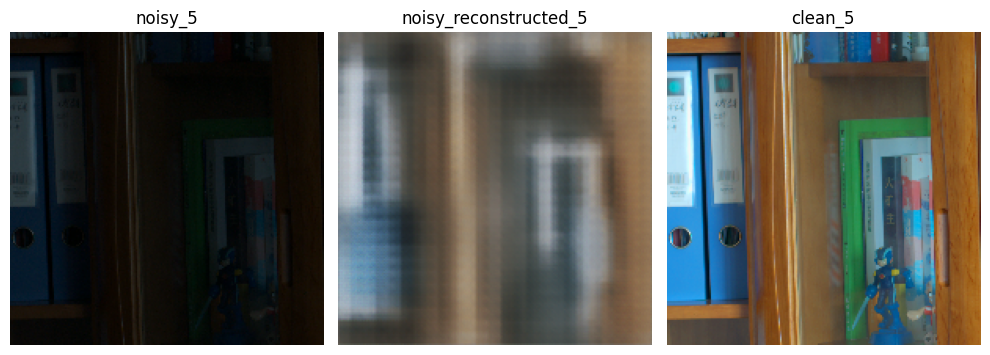

In [58]:
from itertools import zip_longest

modified_autoencoder_model.eval()

noisy_test_batch = noisy_test_batch.to(device)
modified_autoencoder_model = modified_autoencoder_model2.to(device)

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
    print(noisy_test_batch.shape, clean_test_batch.shape)
    print()
    noisy_test_batch = noisy_test_batch.to("cuda")
    clean_test_batch = clean_test_batch.to("cuda")
    print(f"noisy_test_batch is on {noisy_test_batch.device}")
    print(f"clean_test_batch is on {clean_test_batch.device}")

    print(device)
    if next(modified_autoencoder_model2.parameters()).is_cuda:
        print("Model is on CUDA (GPU)")
    else:
        print("Model is on CPU")
    noisy_reconstructed = modified_autoencoder_model2(noisy_test_batch)

    print(f"noisy_reconstructed_batch is on {noisy_reconstructed.device}")


    for i in range(noisy_test_batch.shape[0]):
        noisy_test_img = noisy_test_batch[i]
        noisy_recons_img = noisy_reconstructed[i]
        clean_test_img = clean_test_batch[i]
        showImages3(noisy_test_img, noisy_recons_img, clean_test_img, f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}",save_path=f"/content/drive/MyDrive/Colab Notebooks/attempt_4_loss_b_only_noisy_clean_40_epochs{i}.png" )
        # pass

        if i == 5:
            break


Attempt 4 : After 80 Epochs

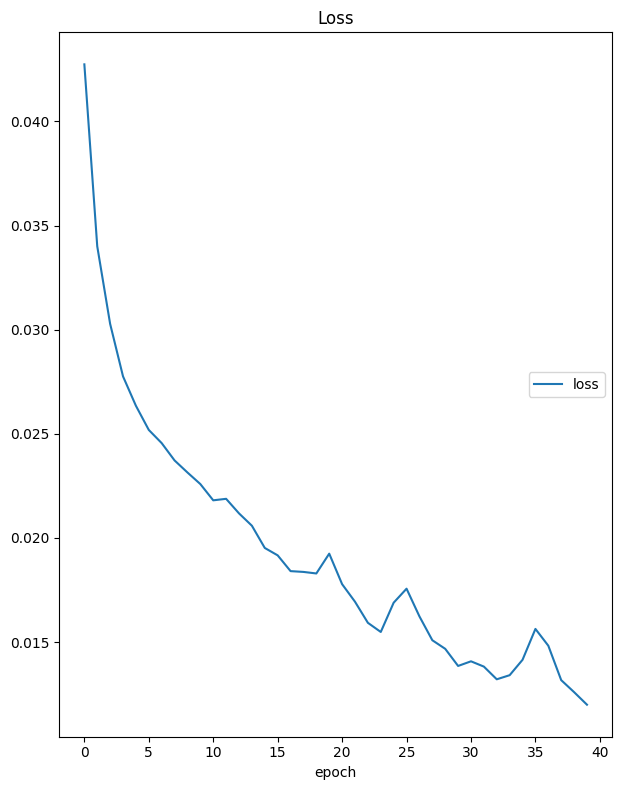

Loss
	loss             	 (min:    0.012, max:    0.043, cur:    0.012)


In [59]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_4_on_dark_images_loss_noisy_reconstructed_clean.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoencoder_model2 = ModConvDenoiser19()
modified_autoencoder_model2.train()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoencoder_model2.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoencoder_model2.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images, noisy_images in zip(clean_data_loader, noisy_data_loader):
            # Move data to GPU if available
            clean_images = clean_images.to(device)
            noisy_images = noisy_images.to(device)

            # clear the gradients of all optimized variables
            optimizer.zero_grad()

            ## forward pass: compute predicted outputs by passing *noisy* images to the model
            # clean_reconstructed = modified_autoencoder_model2(clean_images)
            noisy_reconstructed = modified_autoencoder_model2(noisy_images)

            # Compute the loss (MSE between clean and reconstructed images)
            loss = criterion(noisy_reconstructed, clean_images)

            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoencoder_model2.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

torch.Size([15, 3, 200, 200]) torch.Size([15, 3, 200, 200])

noisy_test_batch is on cuda:0
clean_test_batch is on cuda:0
cuda:0
Model is on CUDA (GPU)
noisy_reconstructed_batch is on cuda:0


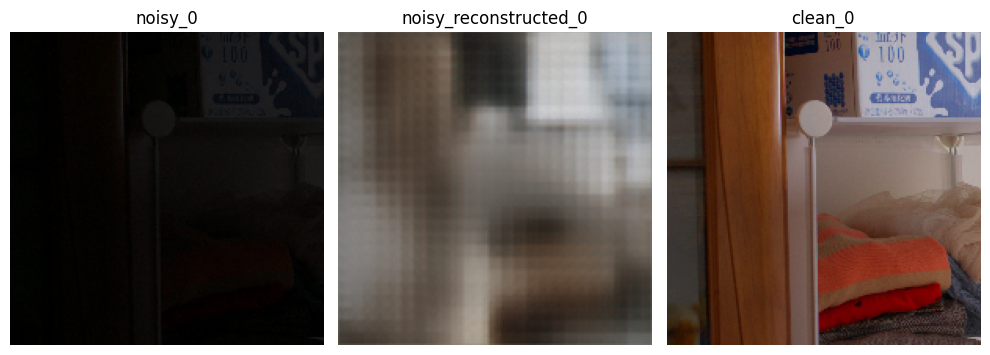

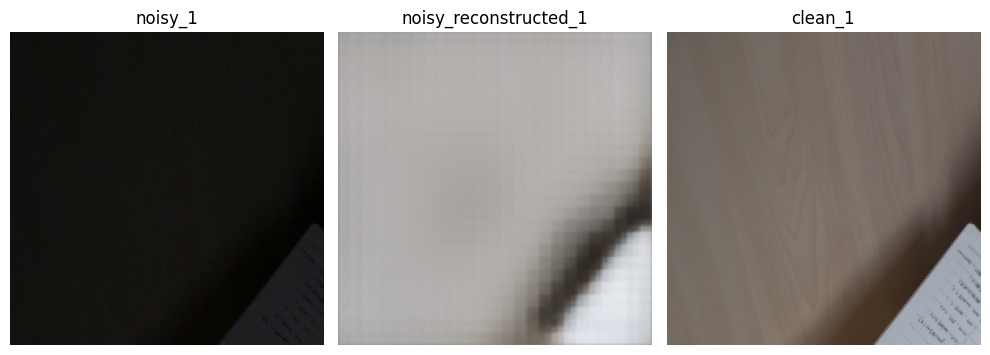

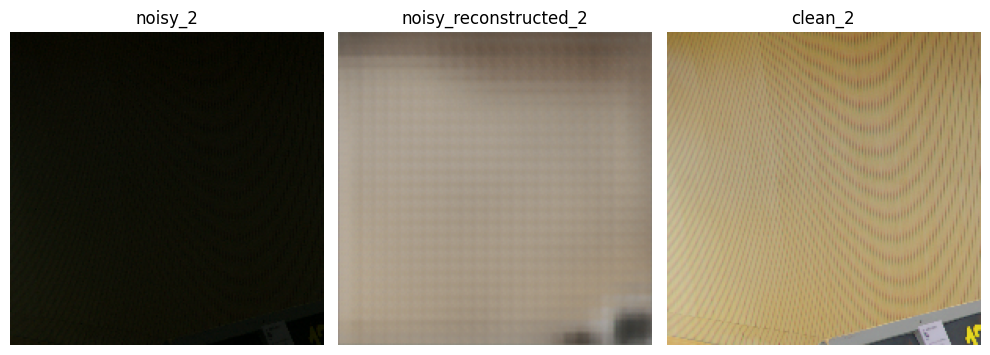

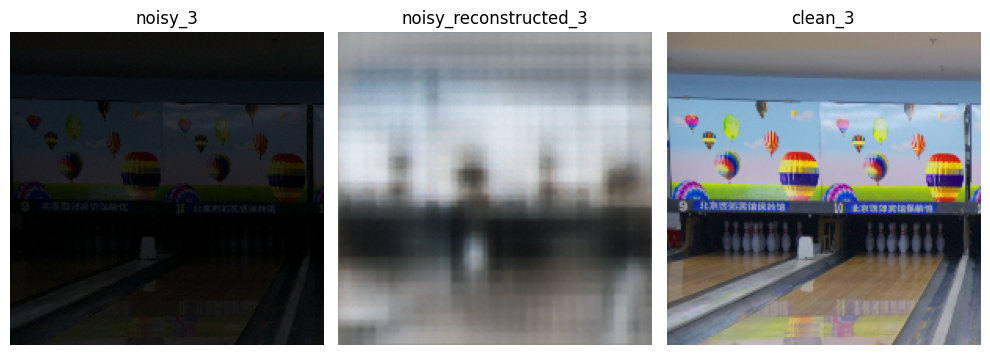

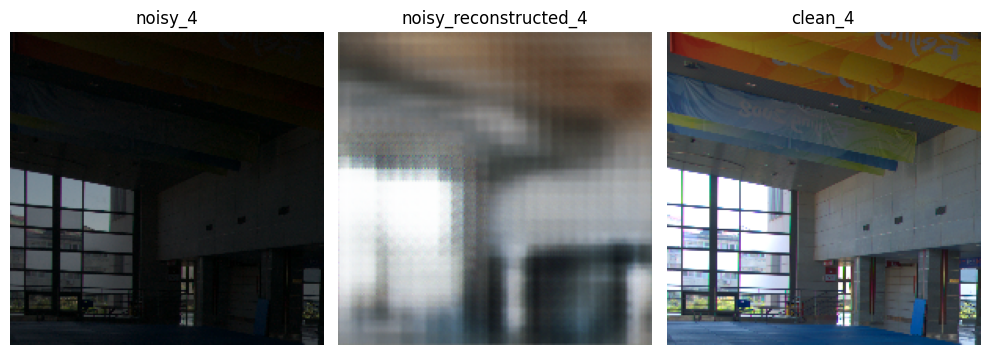

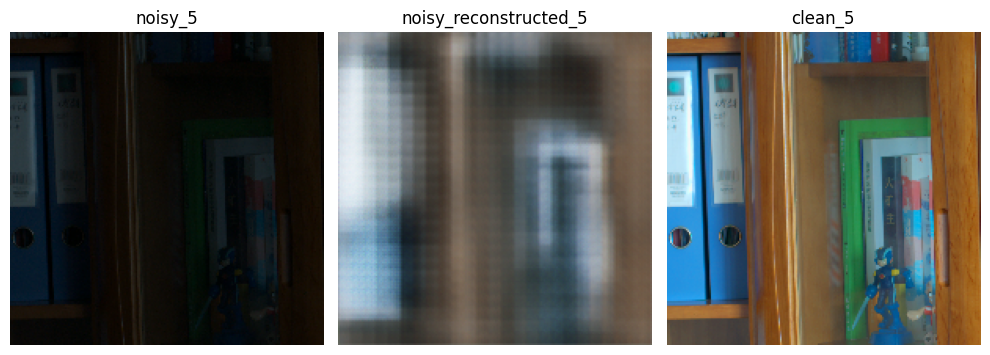

In [60]:
from itertools import zip_longest

modified_autoencoder_model.eval()

noisy_test_batch = noisy_test_batch.to(device)
modified_autoencoder_model = modified_autoencoder_model2.to(device)

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
    print(noisy_test_batch.shape, clean_test_batch.shape)
    print()
    noisy_test_batch = noisy_test_batch.to("cuda")
    clean_test_batch = clean_test_batch.to("cuda")
    print(f"noisy_test_batch is on {noisy_test_batch.device}")
    print(f"clean_test_batch is on {clean_test_batch.device}")

    print(device)
    if next(modified_autoencoder_model2.parameters()).is_cuda:
        print("Model is on CUDA (GPU)")
    else:
        print("Model is on CPU")
    noisy_reconstructed = modified_autoencoder_model2(noisy_test_batch)

    print(f"noisy_reconstructed_batch is on {noisy_reconstructed.device}")


    for i in range(noisy_test_batch.shape[0]):
        noisy_test_img = noisy_test_batch[i]
        noisy_recons_img = noisy_reconstructed[i]
        clean_test_img = clean_test_batch[i]
        showImages3(noisy_test_img, noisy_recons_img, clean_test_img, f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}",save_path=f"/content/drive/MyDrive/Colab Notebooks/attempt_4_loss_b_only_noisy_clean_40_epochs{i}.png" )
        # pass

        if i == 5:
            break


# Attempt 5 : Try removing the bluriness

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import copy

# define the NN architecture
class ModConvDenoiser19(nn.Module):
    def __init__(self):
        super(ModConvDenoiser19, self).__init__()
        ## encoder layers ##
        self.encoder = nn.Sequential(
            # in_channels : number of channels per image ; for RGB -> 3
            # out_channels : number of convolutional filters with #in_channel of kernels per filters

            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=32), # number of channels are the features
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=64),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=64, out_channels=128,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=128),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(in_channels=128, out_channels=256,kernel_size=3, padding=1,stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=256)

        )

        self.decoder = nn.Sequential(


            # nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            # nn.ReLU(),
            # nn.BatchNorm2d(256),

            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(128),

            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(64),

            nn.ConvTranspose2d(in_channels=64, out_channels=32,kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1, stride=1),
            nn.Sigmoid()
        )

        self.model = nn.Sequential(
            self.encoder,
            self.decoder
        )


    def forward(self, x):
        return self.model(x)

    def get_encoder_architecture(self):
      print("*** Encoder Architecture")
      print(self.encoder)

    def get_decoder_architecture(self):
      print("*** Decoder Architecture")
      print(self.decoder)

    def debug_encoder(self,x,printDebugOutput=True):
      """Pass thorugh a dataloader with one image per batch"""
      encoder_test_tensor = copy.deepcopy(x)

      if printDebugOutput:
        print("\nPassing thorugh Encoder >>> \n")
        print("Original Image size : ")
        print(encoder_test_tensor.shape)

      for i, layer in enumerate(self.encoder):

        encoder_test_tensor = layer(encoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(encoder_test_tensor.shape)


      return encoder_test_tensor

    def debug_decoder(self,x,printDebugOutput=True):
      """Pass through a dataloader with one image per batch"""
      # decoder_test_tensor = copy.deepcopy(x)
      decoder_test_tensor = x

      if printDebugOutput:
        print("\nPassing thorugh Decoder >>> \n")
        print("Original Input size : ")
        print(decoder_test_tensor.shape)

      for i, layer in enumerate(self.decoder):

        decoder_test_tensor = layer(decoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(decoder_test_tensor.shape)

      return decoder_test_tensor

# initialize the NN
model = ModConvDenoiser19()

# model.get_encoder_architecture()

encoder_output = model.debug_encoder(test,printDebugOutput=True)
decoder_output = model.debug_decoder(encoder_output,printDebugOutput=True)

In [ ]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_5_partB.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoenocder_model = ModConvDenoiser19()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoenocder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoenocder_model.to(device)  # Move the model to the device
    num_epochs = 50
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images in clean_data_loader:
            clean_images = clean_images.to(device)
            optimizer.zero_grad()

            noisy_reconstructed = modified_autoenocder_model(clean_images)

            loss = criterion(noisy_reconstructed, clean_images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoenocder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [ ]:
for clean_test_batch in clean_test_data_loader:
  print(clean_test_batch.shape)

  clean_reconstructed = modified_autoenocder_model(clean_test_batch.to(device))

  for i in range(clean_test_batch.shape[0]):
    if i==5:
      break
    noisy_test_img = noisy_test_batch[i]
    reconstructed_images = clean_reconstructed[i]
    clean_test_img = clean_test_batch[i]

    showImages_side_by_side( reconstructed_images, clean_test_img,f"clean_reconstructed_{i}", f"clean_{i}")


# Attempt 6 : Modifying the 4th attempt architecture by adding skip connections just like ResNet

In [ ]:
import torch
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()

        # Convolutional layers for the residual block
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.relu1 = nn.ReLU(inplace=True)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        # Shortcut connection (skip connection)
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.relu1(out)
        out = self.bn1(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out += self.shortcut(residual)  # Adding the skip connection

        return out

class ModConvDenoiser_resnet(nn.Module):
    def __init__(self):
        super(ModConvDenoiser_resnet, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1, stride=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=32),
            ResidualBlock(32, 64, stride=2),  # Add residual block with skip connection
            ResidualBlock(64, 128, stride=2),  # Add residual block with skip connection
            ResidualBlock(128, 256, stride=2),  # Add residual block with skip connection
            ResidualBlock(256, 512, stride=1),  # Add residual block with skip connection
        )

        self.decoder = nn.Sequential(
            ResidualBlock(512, 512, stride=1),  # Add residual block with skip connection
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(256),
            ResidualBlock(256, 256, stride=1),  # Add residual block with skip connection
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(128),
            ResidualBlock(128, 128, stride=1),  # Add residual block with skip connection
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(64),
            ResidualBlock(64, 64, stride=1),  # Add residual block with skip connection
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, padding=1, stride=1),
            nn.Sigmoid()
        )

        self.model = nn.Sequential(
            self.encoder,
            self.decoder
        )

    def forward(self, x):
        return self.model(x)

    def get_encoder_architecture(self):
      print("*** Encoder Architecture")
      print(self.encoder)

    def get_decoder_architecture(self):
      print("*** Decoder Architecture")
      print(self.decoder)

    def debug_encoder(self,x,printDebugOutput=True):
      """Pass thorugh a dataloader with one image per batch"""
      encoder_test_tensor = copy.deepcopy(x)

      if printDebugOutput:
        print("\nPassing thorugh Encoder >>> \n")
        print("Original Image size : ")
        print(encoder_test_tensor.shape)

      for i, layer in enumerate(self.encoder):

        encoder_test_tensor = layer(encoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(encoder_test_tensor.shape)


      return encoder_test_tensor

    def debug_decoder(self,x,printDebugOutput=True):
      """Pass through a dataloader with one image per batch"""
      # decoder_test_tensor = copy.deepcopy(x)
      decoder_test_tensor = x

      if printDebugOutput:
        print("\nPassing thorugh Decoder >>> \n")
        print("Original Input size : ")
        print(decoder_test_tensor.shape)

      for i, layer in enumerate(self.decoder):

        decoder_test_tensor = layer(decoder_test_tensor)

        if printDebugOutput:
          print("layer " ,i, ": ", layer )
          print(decoder_test_tensor.shape)

      return decoder_test_tensor

# initialize the NN
model = ModConvDenoiser_resnet()

# model.get_encoder_architecture()

# encoder_output = model.debug_encoder(test,printDebugOutput=True)
# decoder_output = model.debug_decoder(encoder_output,printDebugOutput=True)


In [ ]:
isTraining = False

In [ ]:
# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################

save_path = "checkpoints/modified_archi_model_attempt_6_resnet.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoenocder_model = ModConvDenoiser_resnet()

# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoenocder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if isTraining:
    modified_autoenocder_model.to(device)  # Move the model to the device
    num_epochs = 40
    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images in clean_data_loader:
            clean_images = clean_images.to(device)
            optimizer.zero_grad()

            noisy_reconstructed = modified_autoenocder_model(clean_images)

            loss = criterion(noisy_reconstructed, clean_images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")  # Corrected the printing of loss

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoenocder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [ ]:
modified_autoenocder_model.eval()
for clean_test_batch in clean_test_data_loader:
  print(clean_test_batch.shape)

  clean_reconstructed = modified_autoenocder_model(clean_test_batch.to(device))
  # noisy_test_batch.to("cpu")
  # clean_test_batch.to("cpu")
  # clean_reconstructed.to("cpu")

  # print(f"Device for clean_reconstructed: {clean_reconstructed.device}")
  # print(f"Device for clean_test_img: {clean_test_img.device}")

  clean_reconstructed = clean_reconstructed.to(clean_test_img.device)

  # print(f"Device for clean_reconstructed: {clean_reconstructed.device}")
  # print(f"Device for clean_test_img: {clean_test_img.device}")

  for i in range(clean_test_batch.shape[0]):
    if i==2:
      break
    noisy_test_img = noisy_test_batch[i]

    reconstructed_image = clean_reconstructed[i]
    clean_test_img = clean_test_batch[i]
    # reconstructed_image.to("cpu")
    # clean_test_img.to("cpu")

    showImages_side_by_side( reconstructed_image, clean_test_img,f"clean_reconstructed_{i}", f"clean_{i}")


### Now run this model on Dark Images

In [ ]:
save_path = "checkpoints/modified_archi_model_attempt_6_resnet_on_dark_images_2.pt"

# prompt: ## 4.1 Load Model from the saved checkpoints
modified_autoencoder_model = ModConvDenoiser_resnet()


In [ ]:
modified_autoencoder_model = ModConvDenoiser_resnet()
save_path = "checkpoints/modified_archi_model_attempt_6_resnet_on_dark_images.pt"
# prompt: load pytorch model from save_path

modified_autoencoder_model.load_state_dict(torch.load(save_path))
modified_autoencoder_model.train()


In [51]:
torch.cuda.empty_cache()

In [ ]:
num_epochs = 10

# Create a live plot instance
liveplot = PlotLosses()

# Initialize an empty list to store the loss values
loss_values = []

# Tried training again ####################################


# Define optimizer and criterion
optimizer = torch.optim.Adam(modified_autoenocder_model.parameters(), lr=0.001)
criterion = torch.nn.MSELoss()  # Assuming MSE loss for denoising

# Training loop
if True:
    modified_autoencoder_model.train()
    modified_autoencoder_model.to(device)  # Move the model to the device

    for epoch in range(num_epochs):
        running_loss = 0.0
        for clean_images, noisy_images in zip(clean_data_loader, noisy_data_loader):
            # Move data to GPU if available
            clean_images = clean_images.to(device)
            noisy_images = noisy_images.to(device)

            # clear the gradients of all optimized variables
            optimizer.zero_grad()

            ## forward pass: compute predicted outputs by passing *noisy* images to the model
            clean_reconstructed = modified_autoencoder_model(clean_images)
            noisy_reconstructed = modified_autoencoder_model(noisy_images)

            # Compute the loss (MSE between clean and reconstructed images)
            loss = 0.8 * criterion(noisy_reconstructed, clean_images) +  0.2*criterion(clean_reconstructed, clean_images)

            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

        average_loss = running_loss / len(clean_data_loader)
        loss_values.append(average_loss)

        logs = {'loss': average_loss}
        liveplot.update(logs)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {average_loss}")

        if epoch % 5 == 0:  # Save model weights periodically
            torch.save(modified_autoenocder_model.state_dict(), save_path)
            print("Model was saved...")

        liveplot.draw()

In [ ]:
# # Training loop
# if isTraining:
#   num_epochs = 30
#   for epoch in range(num_epochs):
#       model.to(device)
#       # model.train()
#       running_loss = 0.0
#       for clean_images, noisy_images in zip(clean_loader, noisy_loader):
#           # Move data to GPU if available
#           clean_images = clean_images.to(device)
#           noisy_images = noisy_images.to(device)

#           # clear the gradients of all optimized variables
#           optimizer.zero_grad()

#           ## forward pass: compute predicted outputs by passing *noisy* images to the model
#           # clean_reconstructed = model(clean_images)
#           noisy_reconstructed = model(noisy_images)

#           # Compute the loss (MSE between clean and reconstructed images)
#           # loss = criterion(clean_reconstructed, clean_images) + criterion(noisy_reconstructed, noisy_images)

#           # calculate the loss
#           # the "target" is still the original, not-noisy images

#           loss = criterion(noisy_reconstructed, clean_images)

#           # backward pass: compute gradient of the loss with respect to model parameters
#           loss.backward()
#           # perform a single optimization step (parameter update)
#           optimizer.step()

#           # Update running loss
#           running_loss += loss.item()


#       # Print average loss for the epoch
#       print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {running_loss / len(clean_loader)}")
#       torch.save(model.state_dict(), save_path)
#       print("Model was saved...")


In [ ]:
# prompt: load pytorch model from save_path

modified_autoencoder_model.load_state_dict(torch.load(save_path))


In [ ]:
modified_autoencoder_model.eval()

In [ ]:
noisy_test_img[1].shape

In [ ]:
from itertools import zip_longest


noisy_test_batch = noisy_test_batch.to(device)
modified_autoencoder_model = modified_autoencoder_model.to(device)

for noisy_test_batch, clean_test_batch in zip_longest(noisy_test_data_loader, clean_test_data_loader):
    print(noisy_test_batch.shape, clean_test_batch.shape)
    print()
    noisy_test_batch = noisy_test_batch.to("cuda")
    clean_test_batch = clean_test_batch.to("cuda")
    print(f"noisy_test_batch is on {noisy_test_batch.device}")
    print(f"clean_test_batch is on {clean_test_batch.device}")

    print(device)
    if next(modified_autoencoder_model.parameters()).is_cuda:
        print("Model is on CUDA (GPU)")
    else:
        print("Model is on CPU")
    noisy_reconstructed = modified_autoencoder_model(noisy_test_batch)

    print(f"noisy_reconstructed_batch is on {noisy_reconstructed.device}")


    for i in range(noisy_test_batch.shape[0]):
        noisy_test_img = noisy_test_batch[i]
        noisy_recons_img = noisy_reconstructed[i]
        clean_test_img = clean_test_batch[i]
        showImages3(noisy_test_img, noisy_recons_img, clean_test_img, f"noisy_{i}", f"noisy_reconstructed_{i}", f"clean_{i}",save_path=f"/content/drive/MyDrive/Colab Notebooks/new_{i}.png" )
        # pass

        if i == 3:
            break
